# DIP By HanXuan

In [6]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
os.environ['CUDA_VISIBLE_DEVICES'] = '3'
import time

import torch
from torch.autograd import Variable

from util import *
from network import *
from record import *
from my_network import hourglass_deconv_network
def get_params_list(net):
    params = []
    params_num = 0
    for x in net.parameters():
        params.append(x)
        params_num += np.prod(list(x.size()))
    return params,params_num

In [7]:
start_time = time.time()
# use cuda, or not? be prepared for a long wait if you don't have cuda capabilities.
use_cuda = True
# standard deviation of added noise after each training set
num_steps = 5001
# number of steps to take before saving an output image
save_frequency = 500

In [8]:
# choose either 'ps' or 'dc' as the architecture used.
# input image. the architectures have been designed for 512x512 colour images
image_path = 'images/3_ny0.4.png'
# where to put the output

torch.Size([1, 3, 512, 512])


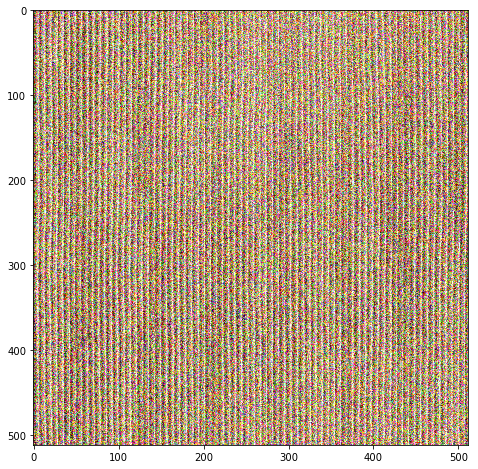

In [9]:
# import image
deconstructed = jpg_to_tensor(image_path, use_cuda)
#save the deconstructed image
# convert deconstructed to variable for calculate loss
deconstructed = Variable(deconstructed)
print(deconstructed.data.shape)
image_np = deconstructed.cpu().data.numpy()
plot_image(image_np,(8,8))

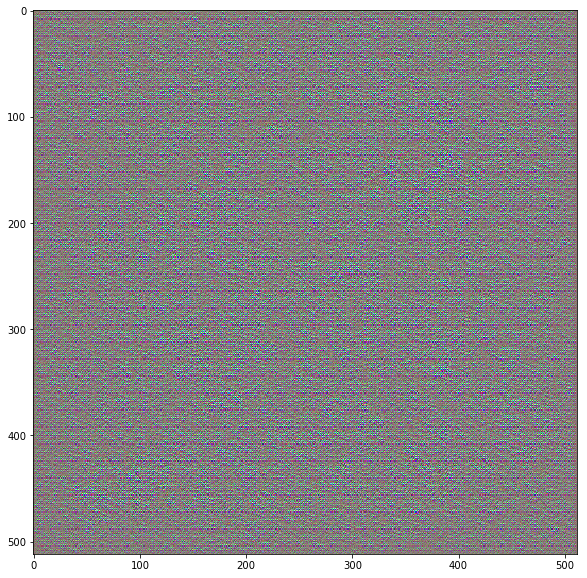

Cost time 0.781942s  At step 00000  loss is 85795.031250


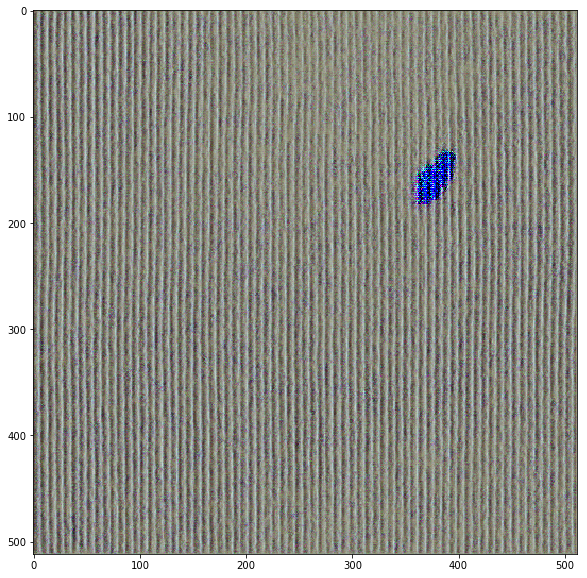

Cost time 24.082567s  At step 00500  loss is 47395.441406


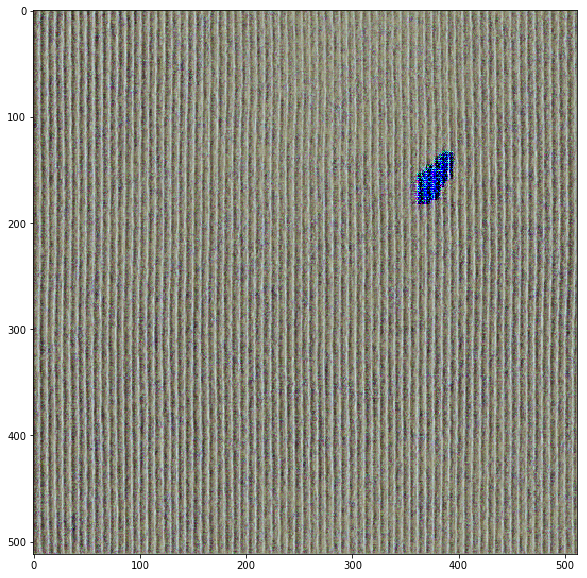

Cost time 44.624761s  At step 01000  loss is 43650.406250


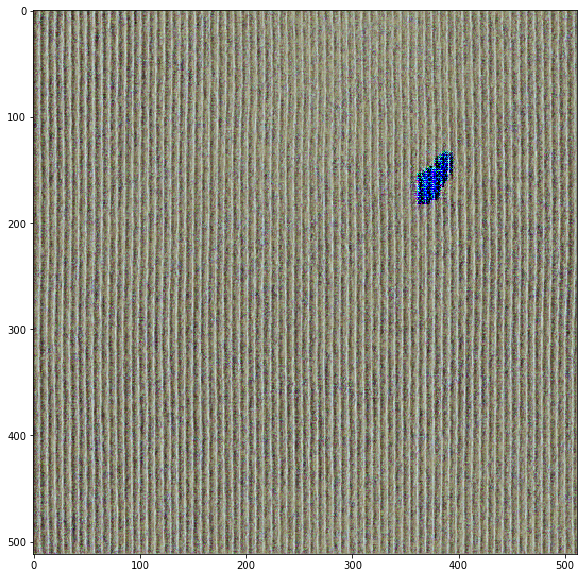

Cost time 65.203731s  At step 01500  loss is 41682.816406


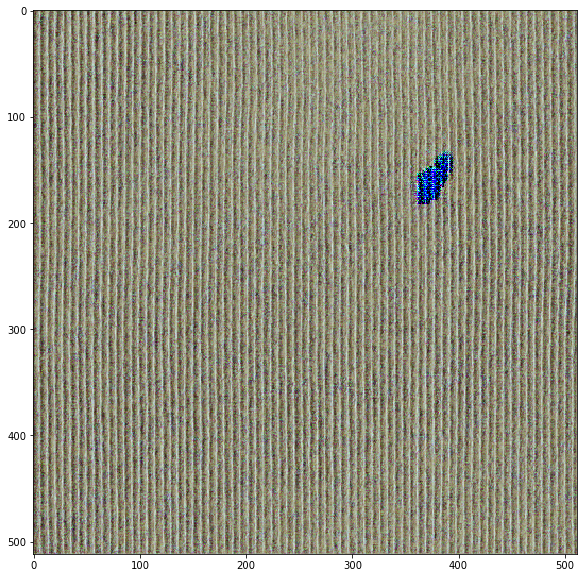

Cost time 85.798812s  At step 02000  loss is 40251.285156


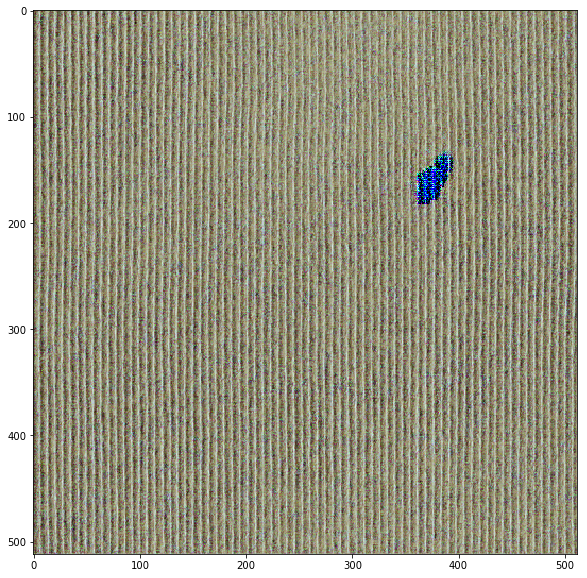

Cost time 106.313697s  At step 02500  loss is 39133.164062


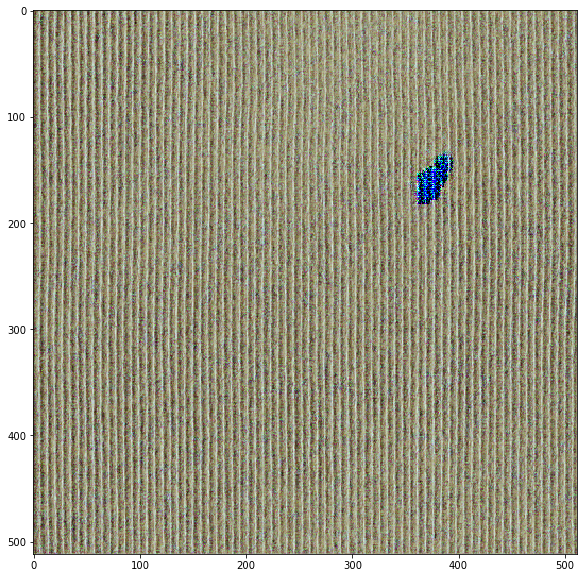

Cost time 126.899183s  At step 03000  loss is 38212.652344


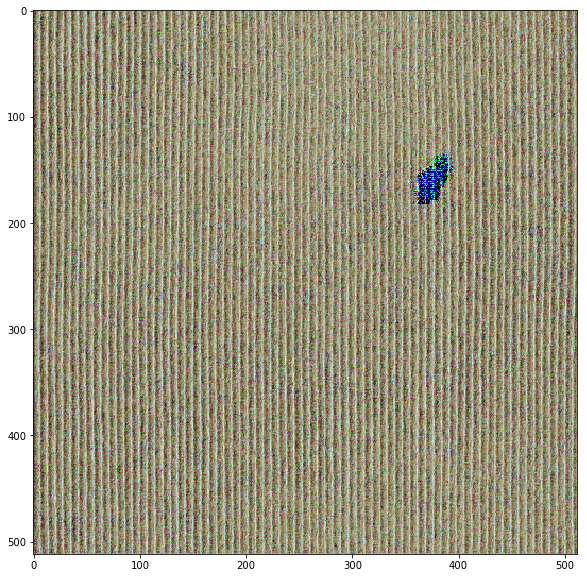

Cost time 147.495394s  At step 03500  loss is 37444.070312


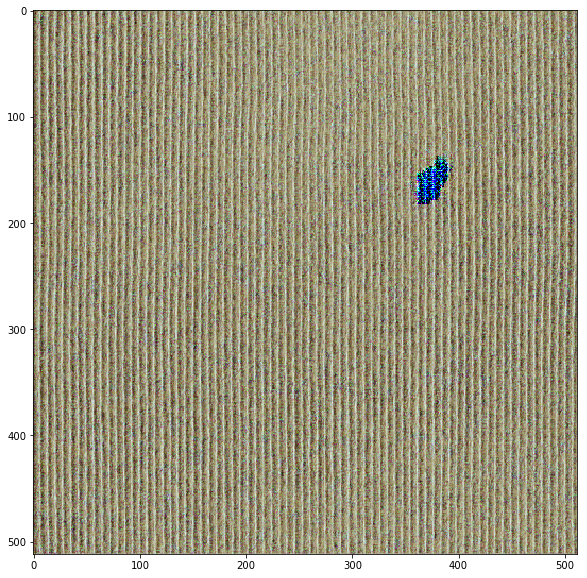

Cost time 168.025512s  At step 04000  loss is 36785.714844


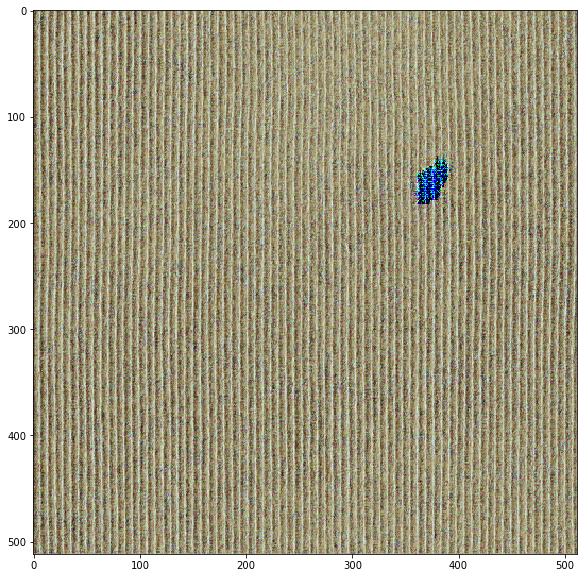

Cost time 188.521058s  At step 04500  loss is 36224.714844


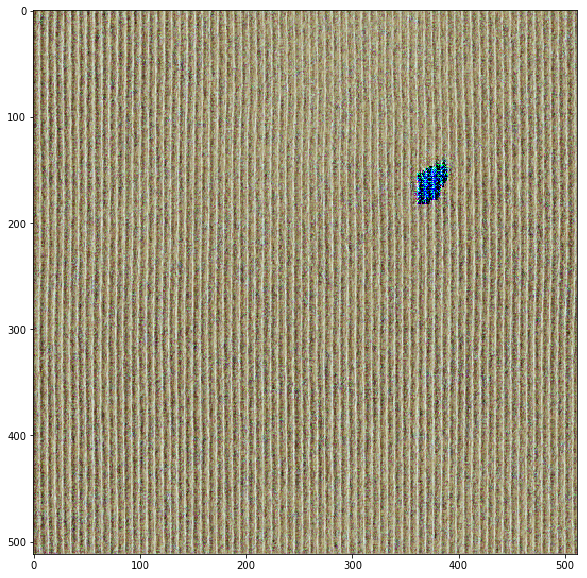

Cost time 209.126162s  At step 05000  loss is 35745.691406


In [10]:
# input of the network is noise
if use_cuda:
    noise = Variable(torch.randn(deconstructed.data.shape).cuda())
else:
    noise = Variable(torch.randn(deconstructed.data.shape))
#initialise the network with the chosen architecture:
net = hourglass_deconv_network()
    
#bind the network to the gpu if cuda is enabled

if use_cuda:
    net.cuda()
#network optimizer set up
p, num = get_params_list(net)
optimizer = torch.optim.Adam(p, lr=1e-4)
#dummy index to provide names to output files
save_img_ind = 0
for step in range(num_steps):
    # get the network output
    output = net(noise)
    # calculate the l2_loss over the masked output and take an optimizer step
    optimizer.zero_grad()
    loss = torch.sum((output - deconstructed)**2)
    loss.backward()
    optimizer.step()
    #every save_frequency steps, save a jpg
    if step % save_frequency == 0:
        time_cost = time.time() - start_time
        loss_value = loss.cpu().data.numpy()[-1]
        # Cost time 236.978221s  At step 02000  loss is 28938.4121094
        print_message='Cost time %fs'%(time_cost) + '  At step %05d  loss is %f' %(step, loss_value)
        image_np = output.cpu().data.numpy()
        plot_image(image_np,(10,10))    
        print(print_message)
        save_img_ind += 1